<a href="https://colab.research.google.com/github/arorashruti18/pytorch-tutorial/blob/main/pytorch_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Pytorch Tutorial

In [2]:
import torch

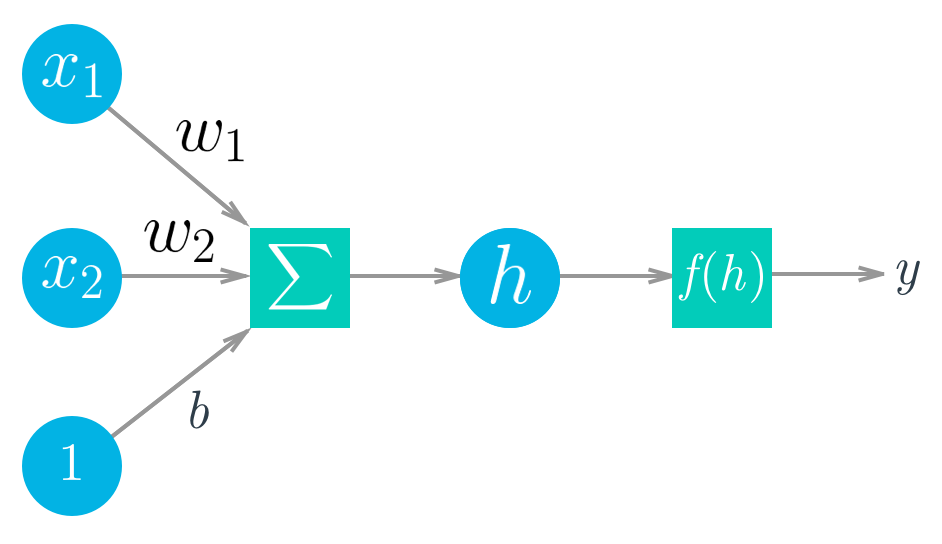

Mathematically it looks like this

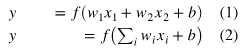

In [3]:
def activation(x):
    """ Sigmoid activation function 
    
        Arguments
        ---------
        x: torch.Tensor
    """
    return 1/(1+torch.exp(-x))

In [4]:
### Generate some data
torch.manual_seed(7) # Set the random seed so things are predictable

# Features are 5 random normal variables
features = torch.randn((1, 5))
# True weights for our data, random normal variables again
weights = torch.randn_like(features)
# and a true bias term
bias = torch.randn((1, 1))

In [5]:
features.shape[1]

5

In [6]:
y = activation(torch.mm(features, weights.view(5,1)) + bias)

Stacking them up

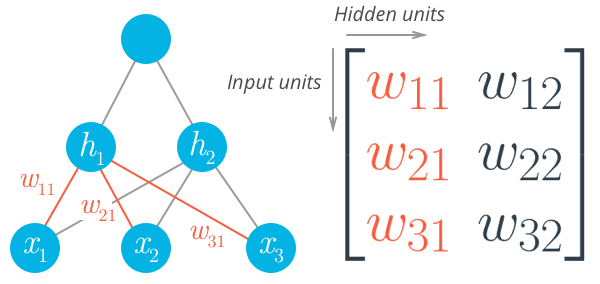

That's how you can calculate the output for a single neuron. The real power of this algorithm happens when you start stacking these individual units into layers and stacks of layers, into a network of neurons. The output of one layer of neurons becomes the input for the next layer. With multiple input units and output units, we now need to express the weights as a matrix.

In [8]:
torch.manual_seed(7) # Set the random seed so things are predictable

# Features are 3 random normal variables
features = torch.randn((1, 3))

# Define the size of each layer in our network
n_input = features.shape[1]     # Number of input units, must match number of input features
n_hidden = 2                    # Number of hidden units 
n_output = 1                    # Number of output units

# Weights for inputs to hidden layer
W1 = torch.randn(n_input, n_hidden)
# Weights for hidden layer to output layer
W2 = torch.randn(n_hidden, n_output)

# and bias terms for hidden and output layers
B1 = torch.randn((1, n_hidden))
B2 = torch.randn((1, n_output))

In [9]:
h = activation(torch.mm(features, W1) + B1)
output = activation(torch.mm(h, W2) + B2)
print(output)

tensor([[0.3171]])


Data Augmentation

In [10]:
!unzip /content/drive/MyDrive/Cat_Dog_data.zip

Streaming output truncated to the last 5000 lines.
  inflating: Cat_Dog_data/train/dog/dog.8636.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.8636.jpg  
  inflating: Cat_Dog_data/train/dog/dog.7505.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.7505.jpg  
  inflating: Cat_Dog_data/train/dog/dog.1174.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.1174.jpg  
  inflating: Cat_Dog_data/train/dog/dog.9528.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.9528.jpg  
  inflating: Cat_Dog_data/train/dog/dog.1612.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.1612.jpg  
  inflating: Cat_Dog_data/train/dog/dog.8150.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.8150.jpg  
  inflating: Cat_Dog_data/train/dog/dog.7263.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.7263.jpg  
  inflating: Cat_Dog_data/train/dog/dog.11043.jpg  
  inflating: __MACOSX/Cat_Dog_data/train/dog/._dog.11043.jpg  
  inflating: Cat_Dog_data/train/dog/dog.634

In [11]:
!wget https://raw.githubusercontent.com/udacity/deep-learning-v2-pytorch/3bd7dea850e936d8cb44adda8200e4e2b5d627e3/intro-to-pytorch/helper.py

--2021-08-06 04:31:33--  https://raw.githubusercontent.com/udacity/deep-learning-v2-pytorch/3bd7dea850e936d8cb44adda8200e4e2b5d627e3/intro-to-pytorch/helper.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2813 (2.7K) [text/plain]
Saving to: ‘helper.py’

helper.py           100%[===================>]   2.75K  --.-KB/s    in 0s      

2021-08-06 04:31:33 (35.3 MB/s) - ‘helper.py’ saved [2813/2813]



In [12]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

import torch
from torchvision import datasets, transforms

import helper
import importlib
importlib.reload(helper)

<module 'helper' from '/content/helper.py'>

**Transforms**

When you load in the data with ImageFolder, you'll need to define some transforms. For example, the images are different sizes but we'll need them to all be the same size for training. You can either resize them with transforms.Resize() or crop with transforms.CenterCrop(), transforms.RandomResizedCrop(), etc. We'll also need to convert the images to PyTorch tensors with transforms.ToTensor(). Typically you'll combine these transforms into a pipeline with transforms.Compose(), which accepts a list of transforms and runs them in sequence. It looks something like this to scale, then crop, then convert to a tensor:

transform = transforms.Compose([transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()])

There are plenty of transforms available, I'll cover more in a bit and you can read through the documentation.

**Data Loaders**

With the ImageFolder loaded, you have to pass it to a DataLoader. The DataLoader takes a dataset (such as you would get from ImageFolder) and returns batches of images and the corresponding labels. You can set various parameters like the batch size and if the data is shuffled after each epoch.

*dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)*

In [13]:
data_dir = '/content/Cat_Dog_data/train'

transform = transforms.Compose([transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()])
dataset = datasets.ImageFolder(data_dir, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)

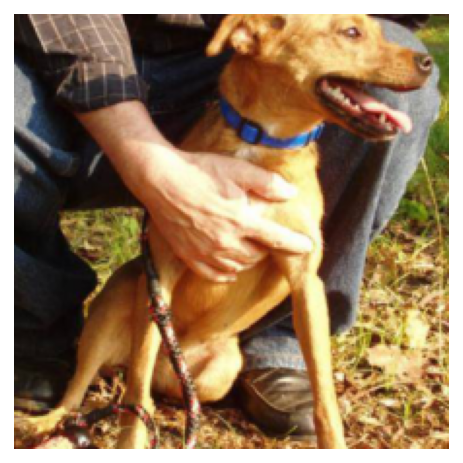

In [14]:
# Run this to test your data loader
images, labels = next(iter(dataloader))
helper.imshow(images[0], normalize=False)

**Data Augmentation**

A common strategy for training neural networks is to introduce randomness in the input data itself. For example, you can randomly rotate, mirror, scale, and/or crop your images during training. This will help your network generalize as it's seeing the same images but in different locations, with different sizes, in different orientations, etc.

To randomly rotate, scale and crop, then flip your images you would define your transforms like this:

train_transforms = transforms.Compose([transforms.RandomRotation(30),
                                       transforms.RandomResizedCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.5, 0.5, 0.5], 
                                                            [0.5, 0.5, 0.5])])

You'll also typically want to normalize images with transforms.Normalize. You pass in a list of means and list of standard deviations, then the color channels are normalized like so

input[channel] = (input[channel] - mean[channel]) / std[channel]

Subtracting mean centers the data around zero and dividing by std squishes the values to be between -1 and 1. Normalizing helps keep the network weights near zero which in turn makes backpropagation more stable. Without normalization, networks will tend to fail to learn.



In [15]:
data_dir = 'Cat_Dog_data'

# TODO: Define transforms for the training data and testing data
train_transforms = transforms.Compose([transforms.RandomRotation(30),
                                       transforms.RandomResizedCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ToTensor()]) 

test_transforms = transforms.Compose([transforms.Resize(255),
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor()])


# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(data_dir + '/train', transform=train_transforms)
test_data = datasets.ImageFolder(data_dir + '/test', transform=test_transforms)

trainloader = torch.utils.data.DataLoader(train_data, batch_size=32)
testloader = torch.utils.data.DataLoader(test_data, batch_size=32)

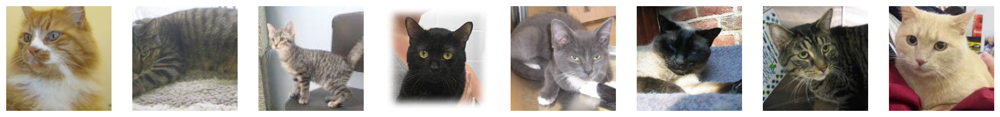

In [16]:
# change this to the trainloader or testloader 
data_iter = iter(testloader)

images, labels = next(data_iter)
fig, axes = plt.subplots(figsize=(20,20), ncols=8)
for ii in range(8):
    ax = axes[ii]
    helper.imshow(images[ii], ax=ax, normalize=False)

In [17]:
from PIL import Image
import matplotlib.pyplot as plt
import random

In [18]:
!curl https://upload.wikimedia.org/wikipedia/commons/a/af/Golden_retriever_eating_pigs_foot.jpg -o dog.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 91273  100 91273    0     0  1061k      0 --:--:-- --:--:-- --:--:-- 1048k


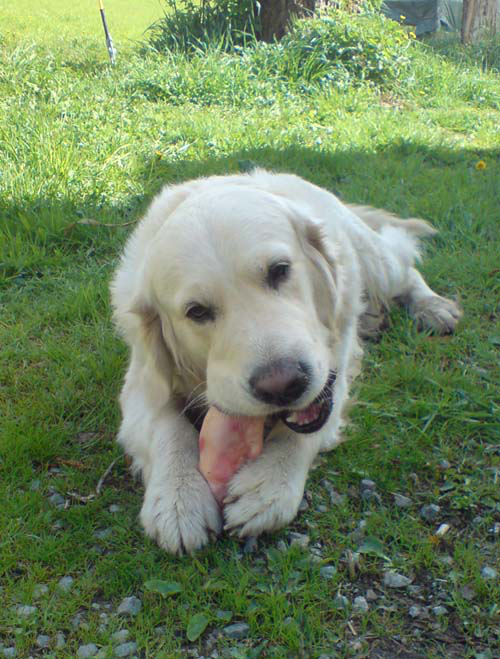

In [19]:
img = Image.open('dog.jpg')
img

(-0.5, 658.5, 499.5, -0.5)

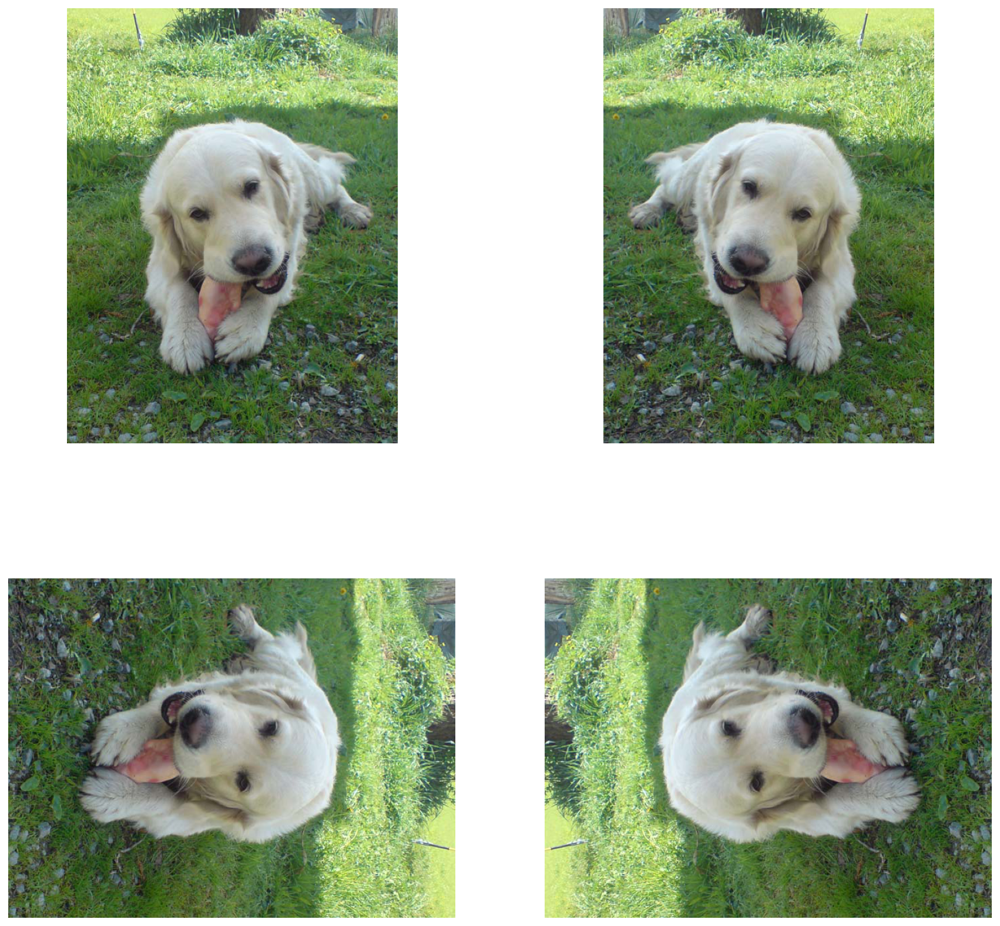

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

axes[0][0].imshow(img)
axes[0][0].axis('off')
axes[0][1].imshow(img.transpose(Image.FLIP_LEFT_RIGHT))
axes[0][1].axis('off')
axes[1][0].imshow(img.transpose(Image.TRANSVERSE))
axes[1][0].axis('off')
axes[1][1].imshow(img.transpose(Image.ROTATE_90))
axes[1][1].axis('off')

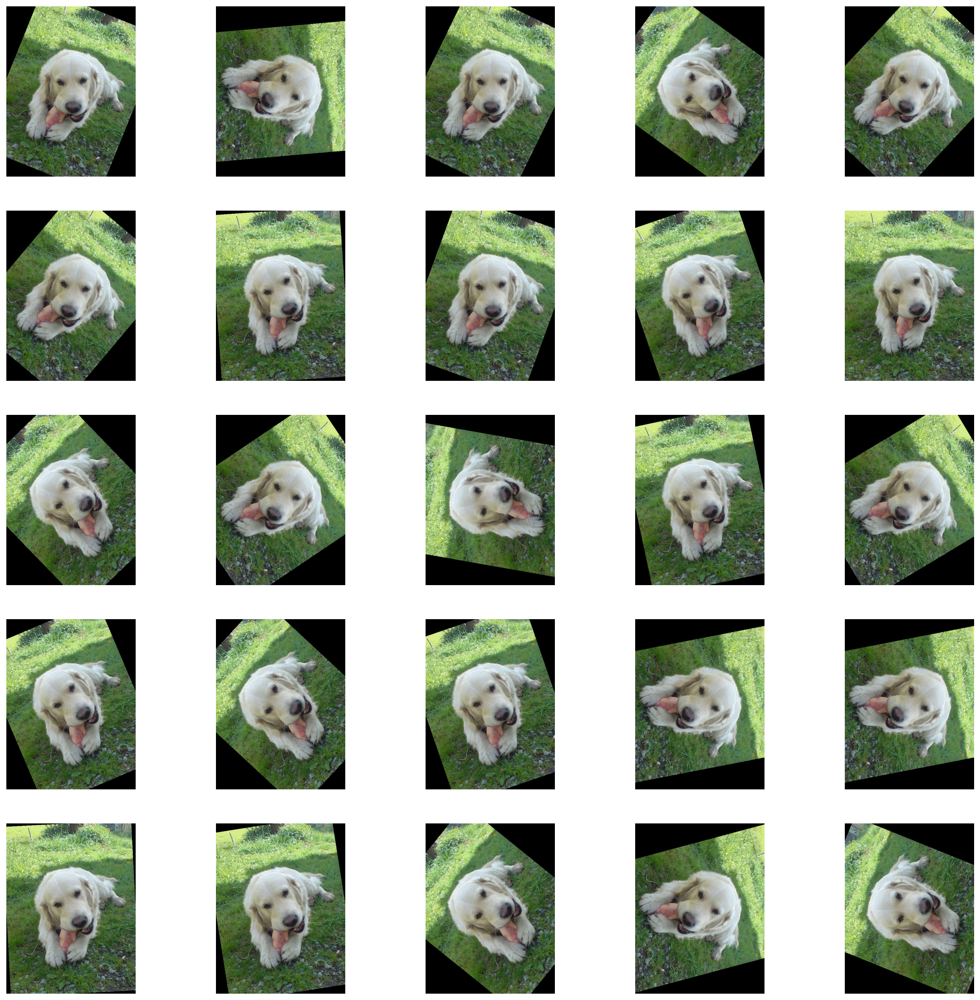

In [21]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

for k, ax in enumerate(axes.ravel()):
    ax.imshow(img.rotate(random.randint(-90, 90)))
    ax.axis('off')

Color transforms

(-0.5, 499.5, 658.5, -0.5)

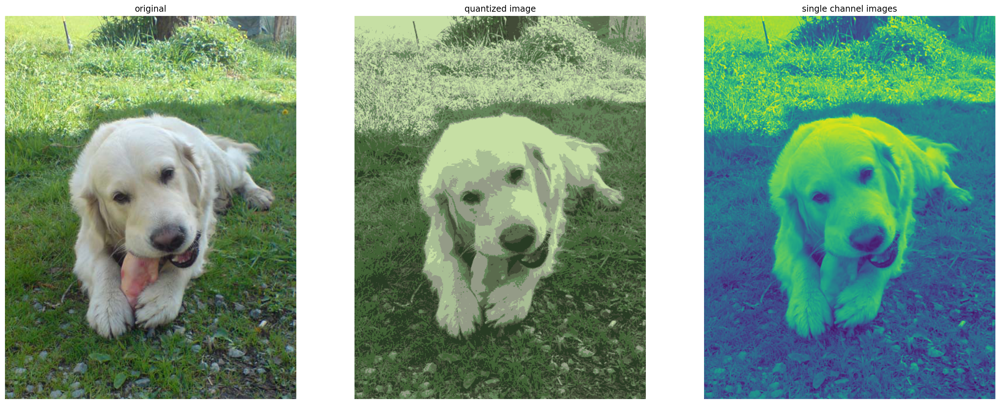

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(25, 10))

axes[0].imshow(img)
axes[0].set_title('original')
axes[0].axis('off')
axes[1].imshow(img.convert("P", palette=Image.ADAPTIVE, colors=8))
axes[1].set_title('quantized image')
axes[1].axis('off')
axes[2].imshow(img.convert('L'))
axes[2].set_title('single channel images')
axes[2].axis('off')

Fashion MNIST data classification

In [23]:
!unzip /content/drive/MyDrive/fashion.zip

Archive:  /content/drive/MyDrive/fashion.zip
  inflating: fashion-mnist_test.csv  
  inflating: fashion-mnist_train.csv  
  inflating: t10k-images-idx3-ubyte  
  inflating: t10k-labels-idx1-ubyte  
  inflating: train-images-idx3-ubyte  
  inflating: train-labels-idx1-ubyte  


In [24]:
import torch 
import torch.nn as nn
import torchvision.datasets as dsets
from skimage import transform
import torchvision.transforms as transforms
from torch.autograd import Variable
import pandas as pd;
import numpy as np;
from torch.utils.data import Dataset, DataLoader
import random;
import math;
import matplotlib.pyplot as plt

In [25]:
num_epochs = 5;
batch_size = 100;
learning_rate = 0.001;

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [27]:
class FashionMNISTDataset(Dataset):
    '''Fashion MNIST Dataset'''
    def __init__(self, csv_file, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file
            transform (callable): Optional transform to apply to sample
        """
        
        data = pd.read_csv(csv_file);
        self.X = np.array(data.iloc[:, 1:]).reshape(-1, 1, 28, 28)#.astype(float);
        self.Y = np.array(data.iloc[:, 0]);
        
        del data;
        self.transform = transform;
        
    def __len__(self):
        return len(self.X);
    
    def __getitem__(self, idx):
        item = self.X[idx];
        label = self.Y[idx];
        
        if self.transform:
            item = self.transform(item);
        
        return (item, label);

In [28]:
train_dataset = FashionMNISTDataset(csv_file='/content/fashion-mnist_train.csv')
test_dataset = FashionMNISTDataset(csv_file='/content/fashion-mnist_test.csv')

In [29]:
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True);
test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=True);

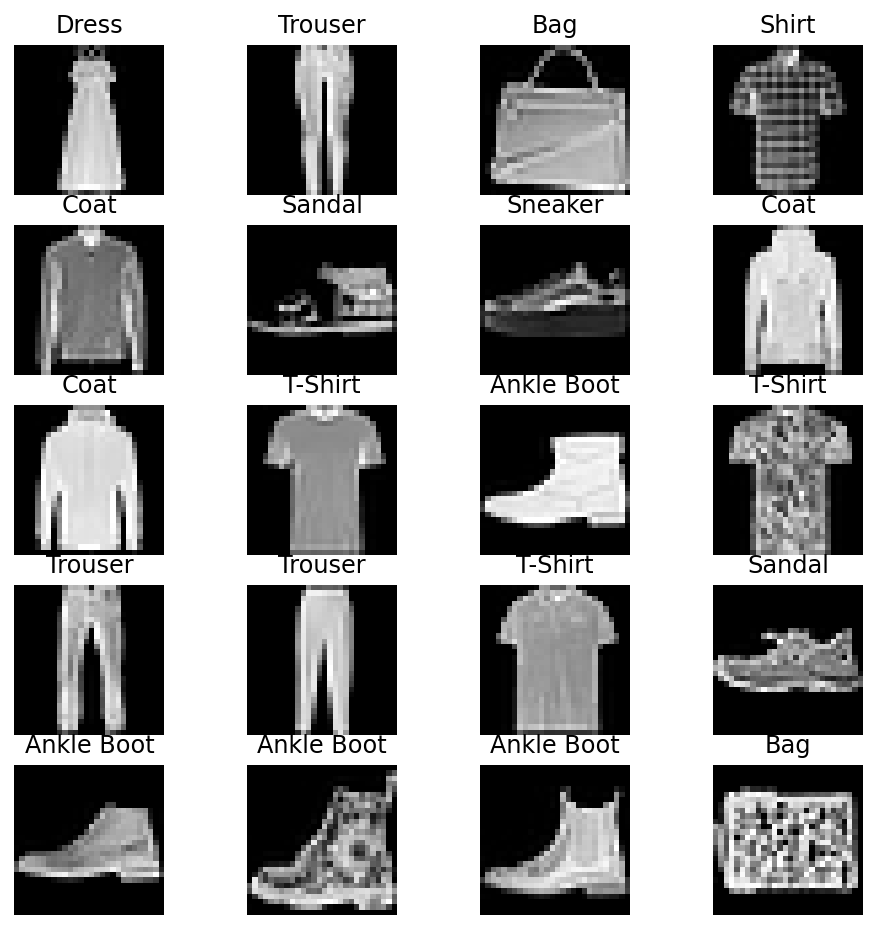

In [30]:
labels_map = {0 : 'T-Shirt', 1 : 'Trouser', 2 : 'Pullover', 3 : 'Dress', 4 : 'Coat', 5 : 'Sandal', 6 : 'Shirt',
              7 : 'Sneaker', 8 : 'Bag', 9 : 'Ankle Boot'};
fig = plt.figure(figsize=(8,8));
columns = 4;
rows = 5;
for i in range(1, columns*rows +1):
    img_xy = np.random.randint(len(train_dataset));
    img = train_dataset[img_xy][0][0,:,:]
    fig.add_subplot(rows, columns, i)
    plt.title(labels_map[train_dataset[img_xy][1]])
    plt.axis('off')
    plt.imshow(img, cmap='gray')
plt.show()

In [31]:
from torch import nn, optim
import torch.nn.functional as F

In [32]:
class Classifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(784, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, 10)
        
    def forward(self, x):
        # make sure input tensor is flattened
        x = x.view(x.shape[0], -1)
        
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.log_softmax(self.fc4(x), dim=1)
        
        return x

In [33]:
# TODO: Create the network, define the criterion and optimizer
model = Classifier()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.003)

In [34]:
# TODO: Train the network here
epochs = 5

for e in range(epochs):
    loss_acc, acc_acc = [], []
    for images, labels in train_loader:
        pred = model(images.float())
        loss = criterion(pred, labels)
        loss_acc.append(loss.item())
        acc_acc.append((pred.argmax(axis=1) == labels).float().mean())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print(f"Training loss: {np.array(loss_acc).mean()}, training accuracy {np.array(acc_acc).mean()}")

Training loss: 0.7997918630888065, training accuracy 0.7761332988739014
Training loss: 0.42718823353449503, training accuracy 0.8489000201225281
Training loss: 0.39432151700059576, training accuracy 0.859749972820282
Training loss: 0.37630391751726466, training accuracy 0.864883303642273
Training loss: 0.36058800215522446, training accuracy 0.8704500198364258


In [35]:
model.eval()
correct = 0
total = 0
for images, labels in test_loader:
    images = Variable(images.float())
    outputs = model(images)
    _, predicted = torch.max(outputs.data, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum()
print('Test Accuracy of the model on the 10000 test images: %.4f %%' % (100 * correct / total))

Test Accuracy of the model on the 10000 test images: 85.8200 %


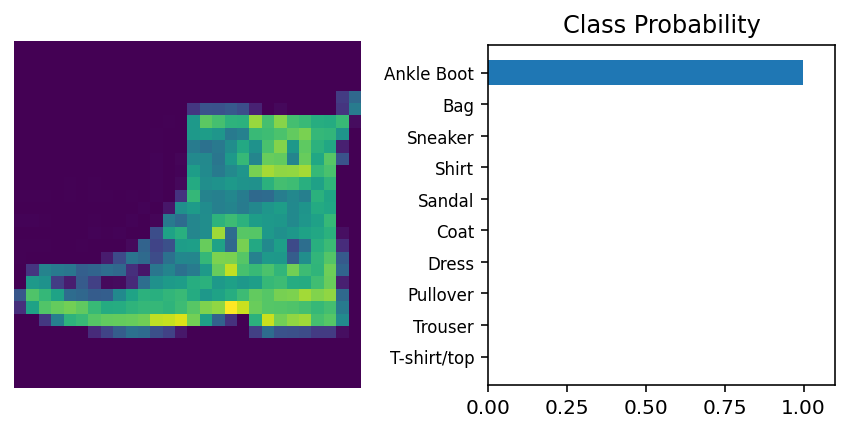

In [36]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import helper
import importlib
importlib.reload(helper)
# Test out your network!

dataiter = iter(test_loader)
images, labels = dataiter.next()
img = images[1]

# TODO: Calculate the class probabilities (softmax) for img
ps = torch.exp(model(img.float()))

# Plot the image and probabilities
helper.view_classify(img, ps, version='Fashion')

In [ ]:
https://drive.google.com/file/d/13djAMlO89Y-LApFZ0Dtqi66ZgVrtU-ga/view?usp=sharing